# Notebook to preprocess the data to crop the whole scan/mask/label

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
from glob import glob
import pickle
from tqdm.notebook import tqdm
import random

In [2]:
size = 1024  # size to crop out

resized = 256  # size to resize the crops for faster experiments

depth = 12  # use 12 layers instead of the 65  (just fits on gpu with batch size 2 - 24GB)

start_depth = 65 // 2 - depth // 2  # take the middle layers instead of the top

folder = '/home/olli/Projects/Kaggle/Vesuvius'

save_folder = f'Preprocessed_{size}_{depth}_Masked'  # new folder to store the cropped scans for training

path_save = os.path.join(folder, 'Data_New', save_folder)

if not os.path.exists(path_save):
    print(f'Creating {path_save}')
    os.makedirs(path_save)

In [3]:
start_depth

26

In [4]:
path_train = os.path.join(folder, 'Data_New', 'train')

scans = [str(i) for i in range(1, 4)]

path_scans = [os.path.join(path_train, scans[i]) for i in range(3)]

path_scans

['/home/olli/Projects/Kaggle/Vesuvius/Data_New/train/1',
 '/home/olli/Projects/Kaggle/Vesuvius/Data_New/train/2',
 '/home/olli/Projects/Kaggle/Vesuvius/Data_New/train/3']

# Save tuples of (scan, mask, label)

In [5]:
'''Now load all three scans, masks, labels to create the final training data and save it into a folder each.
   For this the scan, mask and label will be padded to be perfectly devidable by the size.
   Then loop over all possible height/width values to crop out every region of interest possible with a stride of
   size // 2.
   Then save the cropped scan and label. The mask should also be saved to try masked loss.
   Save all the crops to two folder: One with the original size for the final training and one where all values are
   resized to a smaller value for faster experimenting.
   Also return the width & height values to later plot the cropped regions.'''

def crop_scan(path, name=False):
    
    # define the paths to the mask, the label, and the scans
    path_mask = os.path.join(path, 'mask.png')
    path_label = os.path.join(path, 'inklabels.png')
    scan_paths = glob(path + '/surface_volume/*.tif')
    scan_paths.sort()
    scan_paths = scan_paths[start_depth:start_depth+depth]  # only the depth layers defined
    mask = cv2.imread(path_mask, cv2.IMREAD_GRAYSCALE)
    label = cv2.imread(path_label, cv2.IMREAD_GRAYSCALE)
    
    # get the height and width to assign each layer in a fitting array
    height, width = mask.shape
    
    scan = np.empty((height, width, depth), dtype=np.uint8)
    
    for layer, scan_path in enumerate(scan_paths):
        current_layer = cv2.imread(scan_path, cv2.IMREAD_GRAYSCALE)
        scan[:, :, layer] = current_layer
   
    # first add zeros around the mask/label/scan to make it perfectly dividable by size
    rest_height = height % size
    rest_width = width % size
    
    # values to add
    add_height = size - rest_height
    add_width = size - rest_width
    
    # now add halt of the size again to allways start with the roi at the former start
    add_height += size // 2
    add_width += size // 2
    
    # new shapes
    new_height = height + add_height
    new_width = width + add_width
    
    # now needs to be perfectly devidable by size // 2
    assert new_height % (size // 2) == 0
    assert new_width % (size // 2) == 0
    
    # create a new mask/label/scan with the new shape and only zeros
    new_mask = np.zeros((new_height, new_width), dtype=np.uint8)
    new_label = np.zeros((new_height, new_width), dtype=np.uint8)
    new_scan = np.zeros(((new_height, new_width, depth)), dtype=np.uint8)
    
    # now add the mask/label/scan in the correct place (i.e. in the middle after padding)
    start_height = add_height // 2
    start_width = add_width // 2
    
    # assign them
    new_mask[start_height: start_height + height, start_width: start_width + width] = mask
    new_label[start_height: start_height + height, start_width: start_width +  width] = label
    new_scan[start_height: start_height + height, start_width: start_width + width, :] = scan

    # short on ram
    del mask
    del label
    del scan
    
    # add all height and width values to a dict where the key is the filename (index) -> plot later to see crop
    height_values, width_values = {}, {}
    
    # save it to the folder name (each scan later is one fold)
    if name:
        path_save_scan = os.path.join(path_save, str(name))
        path_save_original = os.path.join(path_save_scan, str(size))  # original size folder
        path_save_resized = os.path.join(path_save_scan, str(resized))  # resized folder
        
        if not os.path.exists(path_save_original):
            os.makedirs(path_save_original)
        if not os.path.exists(path_save_resized):
            os.makedirs(path_save_resized)
        
        index = 0  # index for a unique filename
        
        # loop over all the possible heights and widths, crop them out and then save them to the new folder
        for h in tqdm(range(0, new_height - size // 2, size // 2)):
            
            for w in range(0, new_width - size // 2, size // 2):
                
                label_crop = new_label[h: h + size, w: w + size]
                mask_crop = new_mask[h: h + size, w: w + size]
                
                #check_mask = mask_crop * roi  # check for scan in roi and use this as the mask to save for train
                
                # check if the mask has more then 33% of the scan and also ink in it
                check_mask = mask_crop / 255.
                r = check_mask.sum() / len(check_mask.reshape(-1))
                
                # if the crop has also more then 10% ink in it save it
                check_label = label_crop / 255.
                ink_pct = check_label.reshape(-1).sum() / len(check_label.reshape(-1))
                if r < 0.35 or ink_pct < 0.03:
                    
                    del label_crop
                    del mask_crop
                    
                    continue
                
                # save it (original and resized) and add height/width values from the normal size
                else:
                    height_values[index] = h - start_height
                    width_values[index] = w - start_width
                    
                    scan_crop = new_scan[h: h + size, w: w + size, :]
                    
                    # resize the scan, check_mask and label as well
                    scan_res = cv2.resize(scan_crop, (resized, resized))
                    check_mask_res = cv2.resize(check_mask, (resized, resized))
                    label_crop_res = cv2.resize(label_crop, (resized, resized))
                    
                    tuple_save_original = (scan_crop, mask_crop, label_crop)
                    tuple_save_resized = (scan_res, check_mask_res, label_crop_res)

                    path_original_file = os.path.join(path_save_original, str(index) + '.pickle')
                    path_resized_file = os.path.join(path_save_resized, str(index) + '.pickle')

                    with open(path_original_file, 'wb') as f:
                        pickle.dump(tuple_save_original, f)
                        
                    with open(path_resized_file, 'wb') as f:
                        pickle.dump(tuple_save_resized, f)

                    del label_crop
                    del mask_crop
                    del scan_crop
                    del tuple_save_original
                    del tuple_save_resized
                    
                    index += 1  # increase naming index when crop gets saved
                    
        # finally return the height and width values
        return height_values, width_values
    
    else:
        return height_values, width_values

In [6]:
scan_1_heights, scan_1_widths = crop_scan(path_scans[0], name=1)

  0%|          | 0/16 [00:00<?, ?it/s]

In [7]:
scan_2_heights, scan_2_widths = crop_scan(path_scans[1], name=2)

  0%|          | 0/30 [00:00<?, ?it/s]

In [8]:
scan_3_heights, scan_3_widths = crop_scan(path_scans[2], name=3)

  0%|          | 0/16 [00:00<?, ?it/s]

# Show some results

In [9]:
# plot the specified number of examples from the defined scan

def plot_examples(examples=10, scan_num=1, heights=scan_1_heights, widths=scan_1_widths):
    
    # get the paths of the scan/label and the cropped regions to plot
    path = os.path.join(path_save, str(scan_num), str(size))
    files = glob(path + '/*.pickle')
    random.shuffle(files)
    files = files[:examples]
    path_scan = f'/home/olli/Projects/Kaggle/Vesuvius/Data_New/train/{str(scan_num)}'
    path_scan_layer = glob(path_scan + '/surface_volume/*.tif')
    path_scan_layer.sort()
    path_scan_layer = path_scan_layer[start_depth]
    path_label = os.path.join(path_scan, 'inklabels.png')
    
    # load the scan / label
    scan = cv2.imread(path_scan_layer, cv2.IMREAD_GRAYSCALE)
    label = cv2.imread(path_label, cv2.IMREAD_GRAYSCALE)
    scan = cv2.cvtColor(scan, cv2.COLOR_GRAY2BGR)  # for plotting the height / width values with colors
    label = cv2.cvtColor(label, cv2.COLOR_GRAY2BGR)
    
    # get the filesnames from random files chosen above to get the correct values from the dict with h/w-values
    filenames = [file.split('.')[-2].split('/')[-1] for file in files]

    # now plot all h / w values on the scan/label with colors
    for file in filenames:
        # starting heights and withs for each file
        h = heights[int(file)]
        w = widths[int(file)]
        h_end = h + size
        w_end = w + size
        h_roi_start = h + size // 4  # roi starts 25% of the size
        w_roi_start = w + size // 4
        h_roi_end = h + size * 3 // 4  # roi ends 75% of the scan
        w_roi_end = w + size * 3 // 4
        
        # plot them on the image and label (full crop in red, region of interest in the moddle in green)
        scan = cv2.rectangle(scan, (w, h), (w_end, h_end), (255, 0, 0), 25)
        label = cv2.rectangle(label, (w, h), (w_end, h_end), (255, 0, 0), 25)
    
    # get the filesnames from random files chosen above to get the correct values from the dict with h/w-values
    filenames = [file.split('.')[-2].split('/')[-1] for file in files]
    fig, ax = plt.subplots(1, 2, figsize=(15, 15))
    ax[0].imshow(scan, cmap='gray')
    ax[1].imshow(label, cmap='gray')
    ax[0].axis('off')
    ax[1].axis('off')
    fig.tight_layout()
    fig.patch.set_facecolor('white')
    fig.savefig(folder + f'/Figures/Scan_{scan_num}_RoIs.png', bbox_inches='tight')
    plt.show()
    
    # now also plot the examples (scan, new mask, label)
    fig, ax = plt.subplots(nrows=20, ncols=3, figsize=(8, 3 * 20))
    files_plot = files[:20]
    for row, file  in enumerate(files_plot):
        with open(file, 'rb') as f:
            exp_tuple = pickle.load(f)   
            scan, mask, label = exp_tuple
            ax[row, 0].imshow(scan[:,:,0], cmap='gray')
            ax[row, 1].imshow(mask, cmap='gray')
            ax[row, 2].imshow(label, cmap='gray')
            ax[row, 0].axis(False)
            ax[row, 1].axis(False)
            ax[row, 2].axis(False)
    fig.tight_layout()
    fig.patch.set_facecolor('white')
    title = f'Left: Cropped Scan; Middle: Mask for Loss Calculation; Right: Label'
    fig.suptitle(title, fontsize=12, fontweight='bold', y=1.004)
    fig.savefig(folder + f'/Figures/Scan_{scan_num}_Crops.png', bbox_inches='tight')
    plt.show()

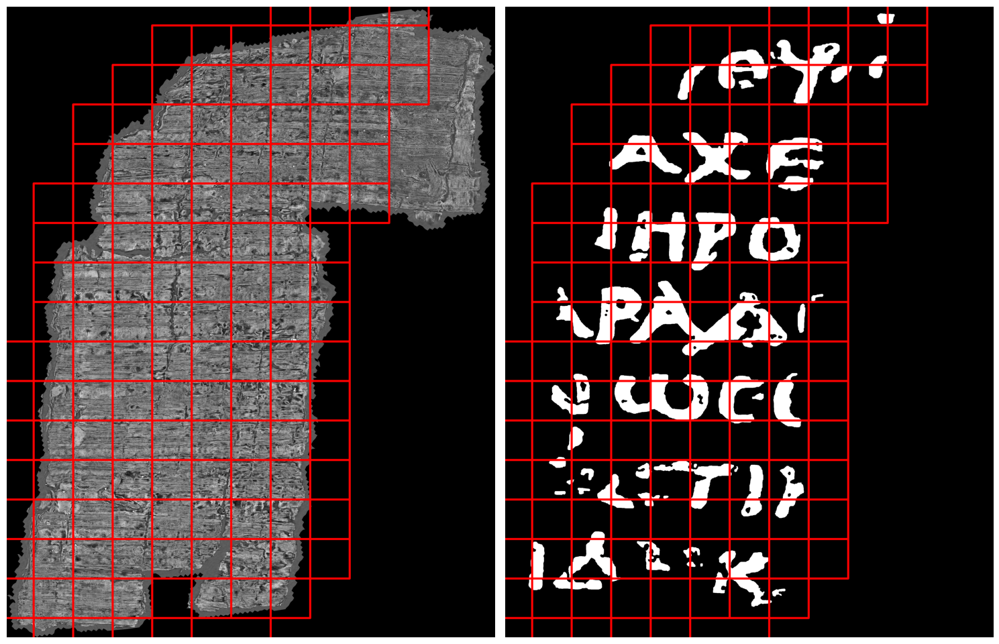

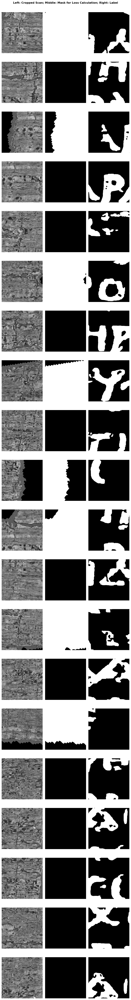

In [10]:
plot_examples(examples=len(scan_1_heights))

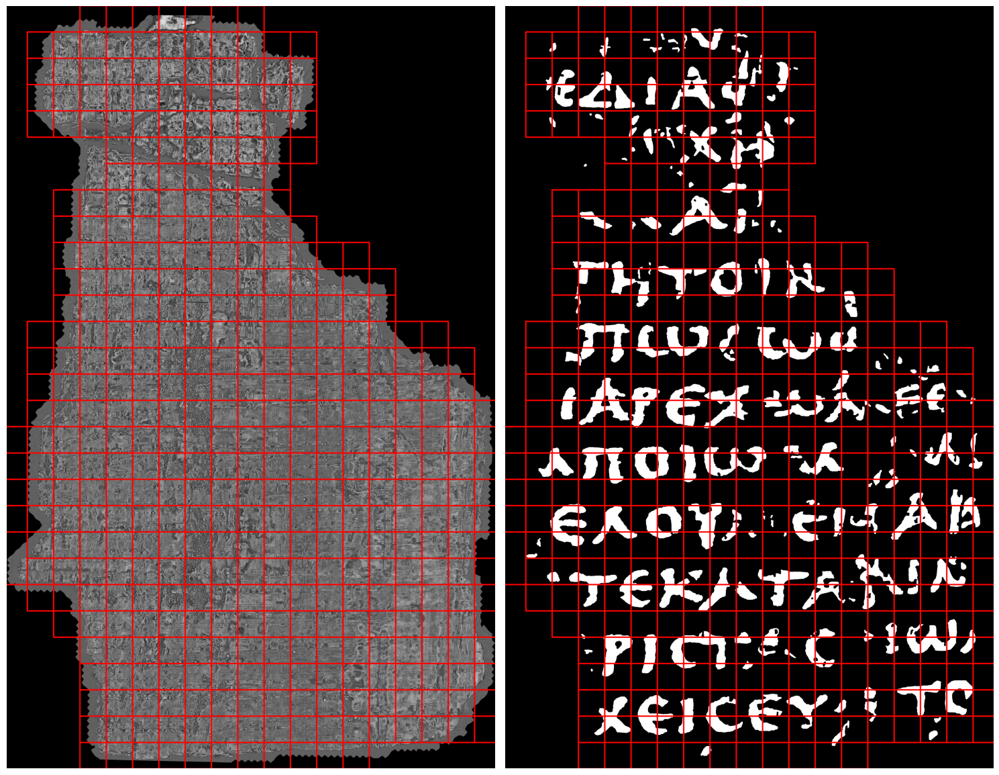

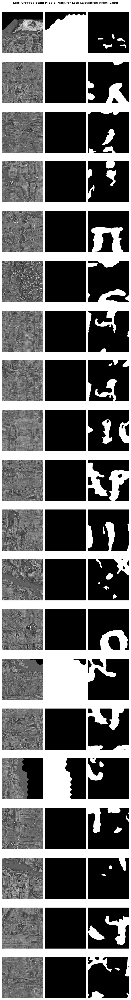

In [11]:
plot_examples(examples=len(scan_2_heights), scan_num=2, heights=scan_2_heights, widths=scan_2_widths)

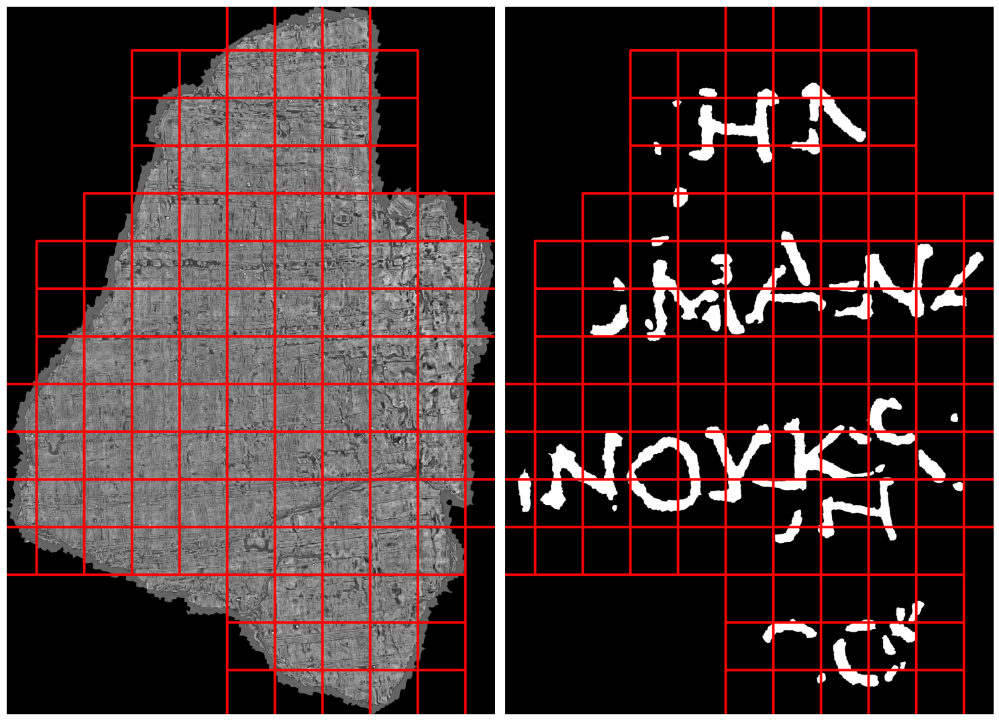

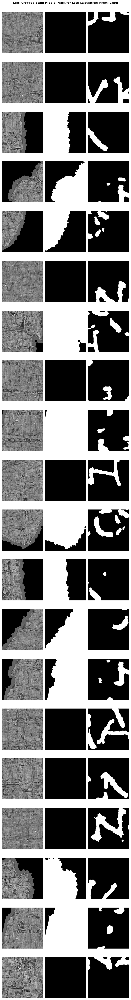

In [12]:
plot_examples(examples=len(scan_3_heights), scan_num=3, heights=scan_3_heights, widths=scan_3_widths)